In [40]:
import sys
import os
os.chdir('/Users/elirotondo/Documents/GitHub/ece590_fall2024')
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image
import time
from custom_datasets import ImageNet100 
import cv2

In [2]:
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

### SAM Mask Layover Function

In [3]:
def show_anns(anns,display="all",mask_num=0):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    if display == "all":
        for ann in sorted_anns:
            m = ann['segmentation']
            color_mask = np.concatenate([np.random.random(3), [0.35]])
            img[m] = color_mask
    elif display == "single_mask":
        ann = sorted_anns[mask_num]
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

# Load SAM Model ViT_L

In [123]:
sam_l = sam_model_registry["vit_l"](checkpoint="eli_dev/seg_any_model/models/vit_l/sam_vit_l_0b3195.pth")
mask_l_generator = SamAutomaticMaskGenerator(
    model=sam_l,
    points_per_side=4,
    pred_iou_thresh=0.85,
    stability_score_thresh=0.9)

# TESTING

In [21]:
imgNet100 = ImageNet100(pd.read_csv("datasets/imagenet100/train_set_meta.csv"))

In [115]:
def show_anns_black(anns,display="all",mask_num=0,sort_col="area"):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x[sort_col]), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    if display == "all":
        for ann in sorted_anns:
            m = ann['segmentation']
            color_mask = np.concatenate([[0,0,0], [1]])
            img[m] = color_mask
    elif display == "single_mask":
        ann = sorted_anns[mask_num]
        m = ann['segmentation']
        color_mask = np.concatenate([[0,0,0], [1]])
        img[m] = color_mask
        ax.set_title(str(round(ann[sort_col],4)) + " (Pixel Area: " + str(ann["area"]) + ")",fontdict={"fontsize":15})
    ax.imshow(img)
    
def disp_helper(img,masks,i,blackout=False,sort_col="area"):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    if blackout:
        show_anns_black(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    else:
        show_anns(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    plt.axis('off')
    plt.show() 
    
def reg_display(img,masks):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    show_anns(masks)
    plt.axis('off')
    plt.show() 

In [116]:
def stage_by_stage_eval(mask_generator,img,img_cls):
    img = img.numpy()
    img = img.transpose((1,2,0))
    img_resize = cv2.resize(img,(224,224))
    
    start_time = time.time()
    masks = mask_generator.generate(img_resize)
    print("Time to automask: " + str(round(time.time() - start_time,2)))
    print()
    print("Number of masks detected: " + str(len(masks)))
    print("Basic overlay of all masks:")
    reg_display(img_resize,masks)
    print()
    top5_area_masks = None
    if len(masks) > 5:
        top5_area_masks = sorted(masks, key=(lambda x: x['area']), reverse=True)[0:5]
        assert len(top5_area_masks) == 5
    else:
        top5_area_masks = masks
    print("Now displaying the five largest masks, sorted by SAM score:")
    for i in range(len(top5_area_masks)):
        disp_helper(img_resize,top5_area_masks,i,blackout=True,sort_col="stability_score")

Time to automask: 112.14

Number of masks detected: 7
Basic overlay of all masks:


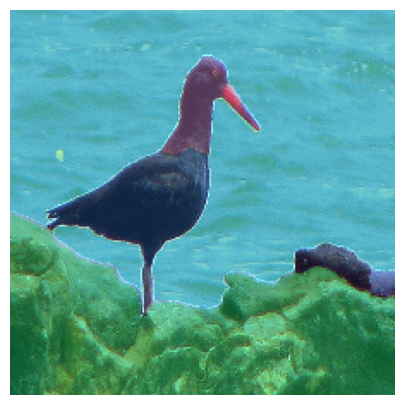


Now displaying the five largest masks, sorted by SAM score:


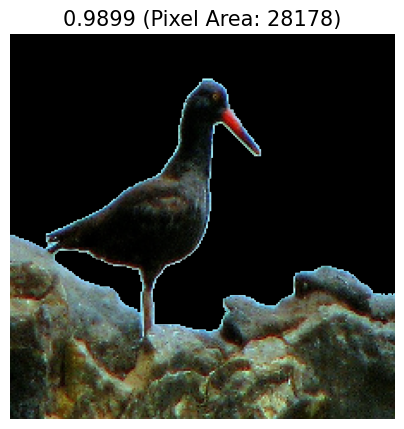

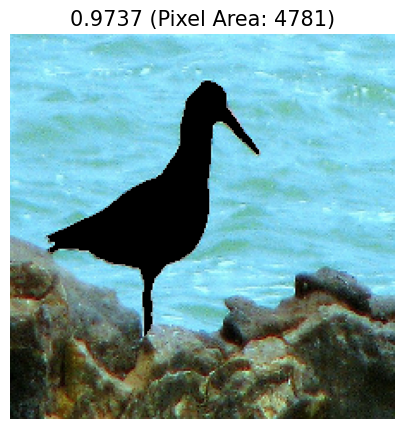

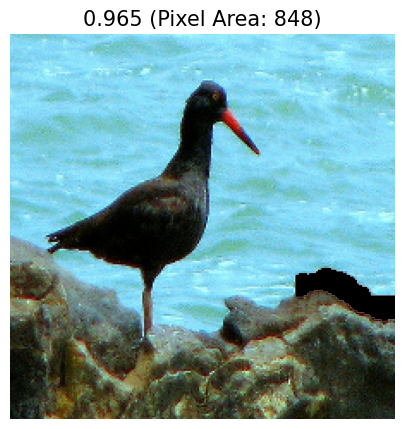

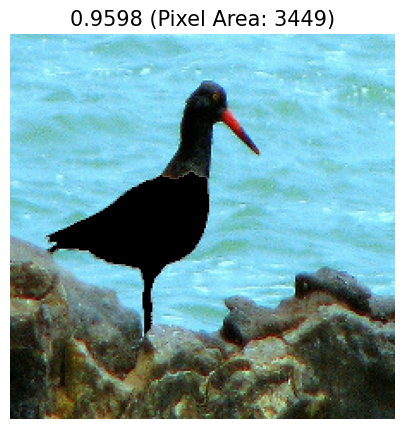

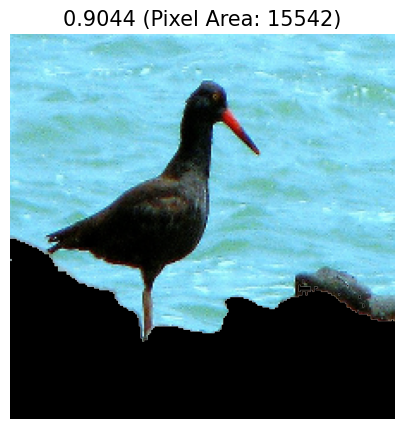

In [124]:
cur_img, cur_img_cls = imgNet100.__getitem__(0)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

Time to automask: 105.73

Number of masks detected: 7
Basic overlay of all masks:


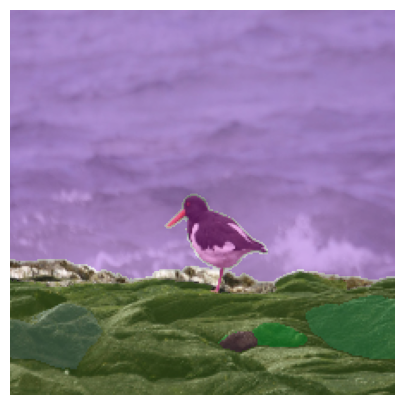


Now displaying the five largest masks, sorted by SAM score:


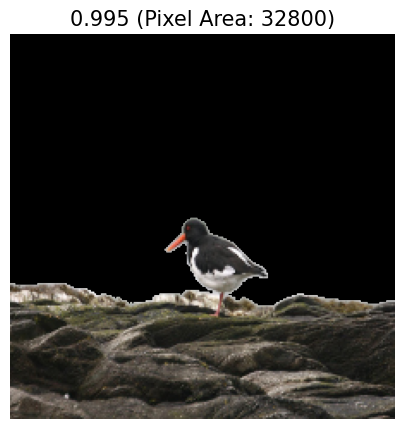

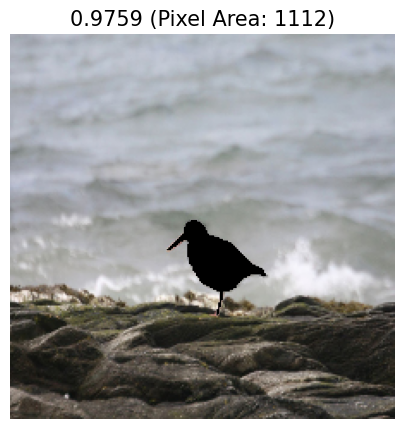

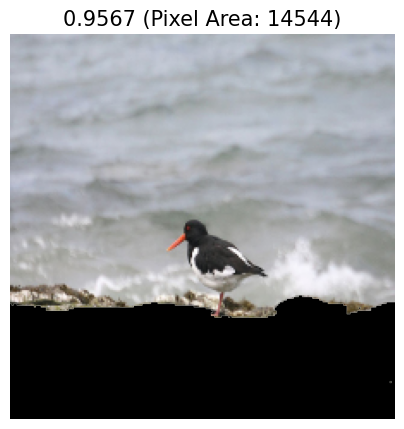

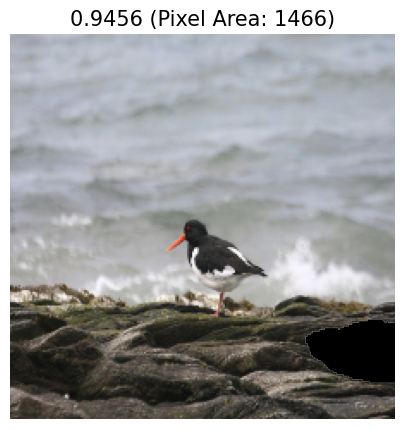

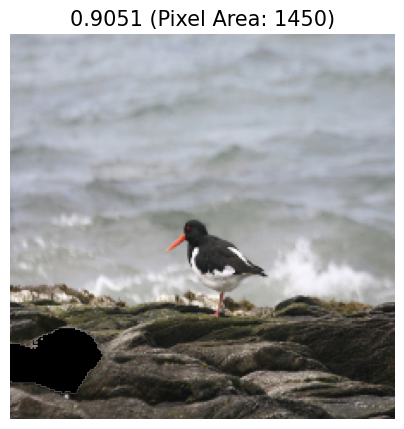

In [125]:
cur_img, cur_img_cls = imgNet100.__getitem__(1)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

Time to automask: 112.03

Number of masks detected: 6
Basic overlay of all masks:


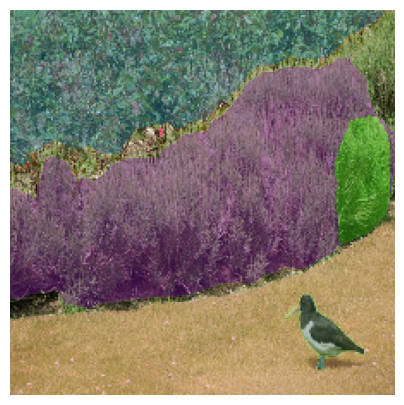


Now displaying the five largest masks, sorted by SAM score:


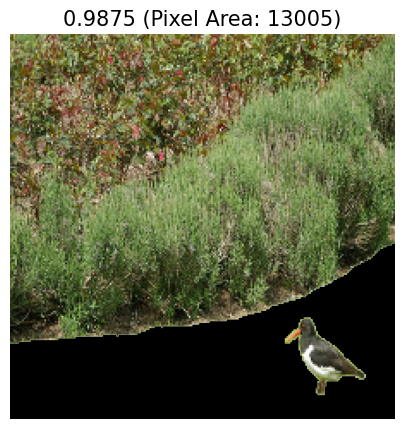

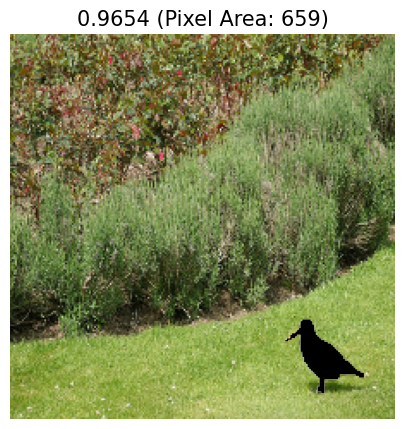

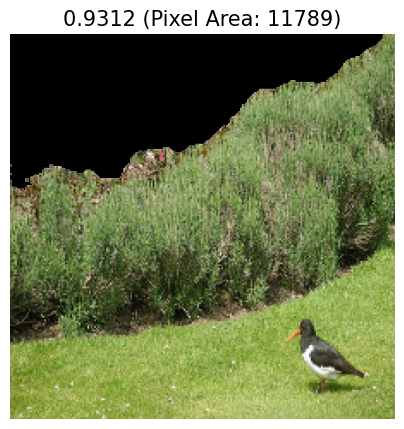

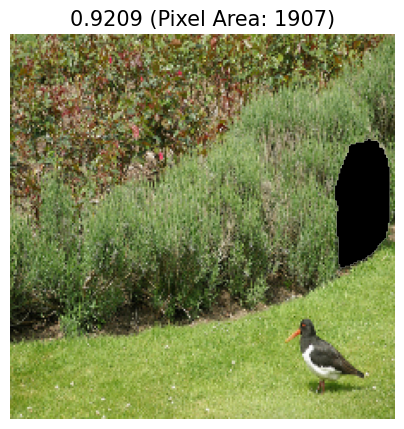

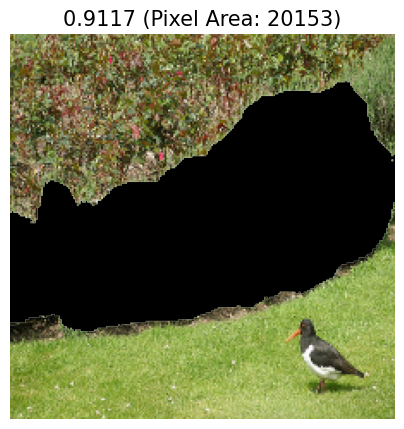

In [126]:
cur_img, cur_img_cls = imgNet100.__getitem__(2)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

Time to automask: 106.44

Number of masks detected: 7
Basic overlay of all masks:


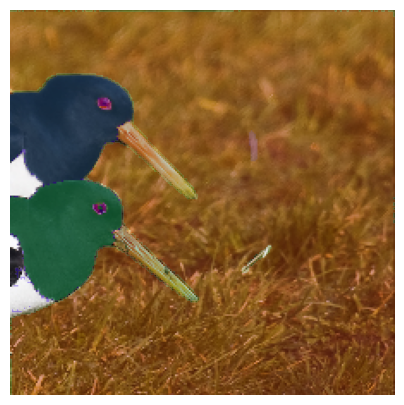


Now displaying the five largest masks, sorted by SAM score:


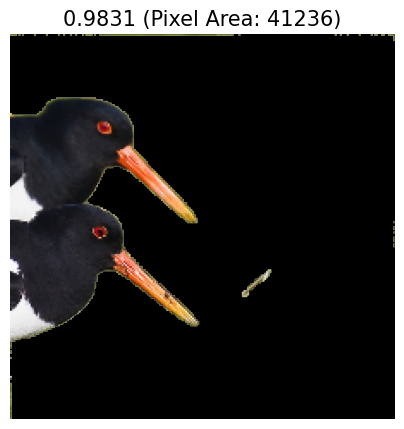

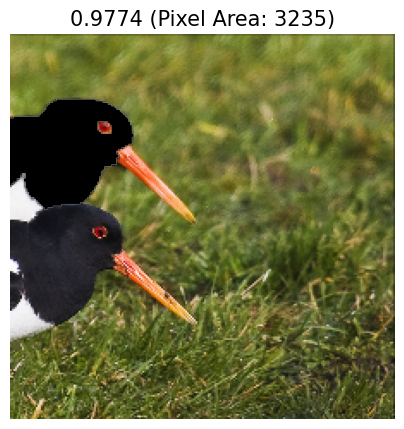

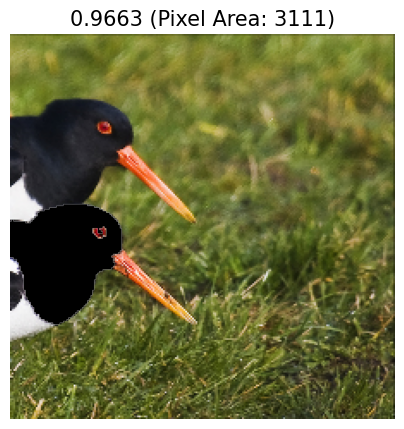

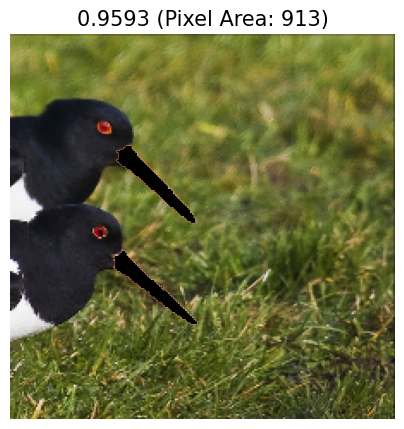

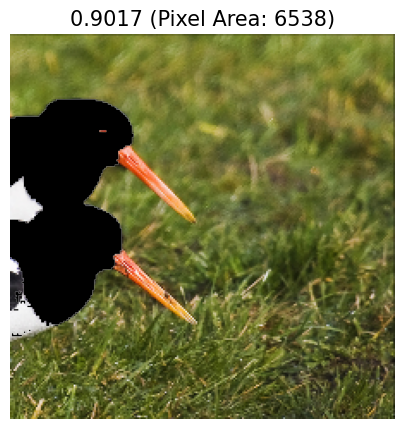

In [127]:
cur_img, cur_img_cls = imgNet100.__getitem__(1000)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

Time to automask: 113.35

Number of masks detected: 7
Basic overlay of all masks:


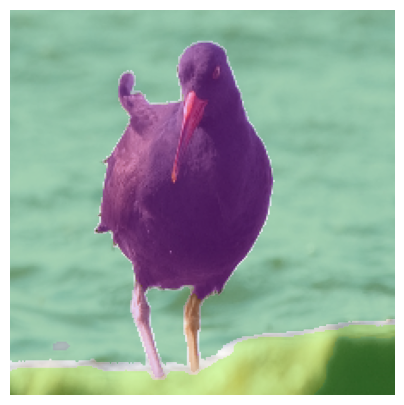


Now displaying the five largest masks, sorted by SAM score:


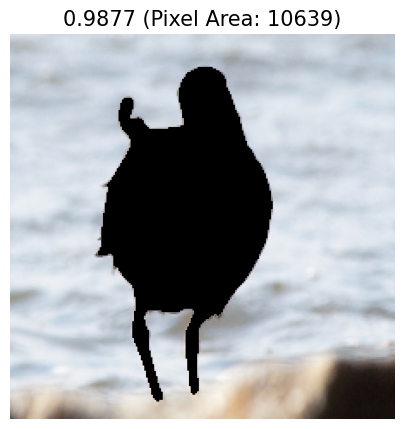

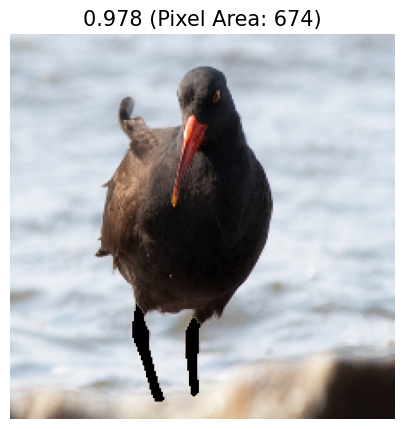

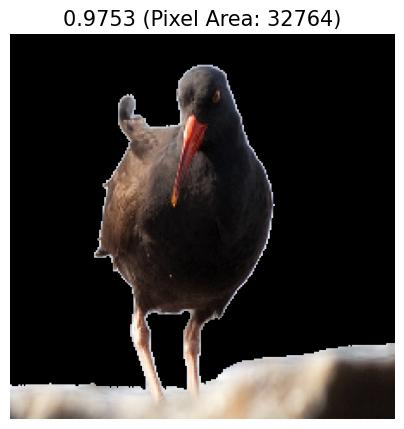

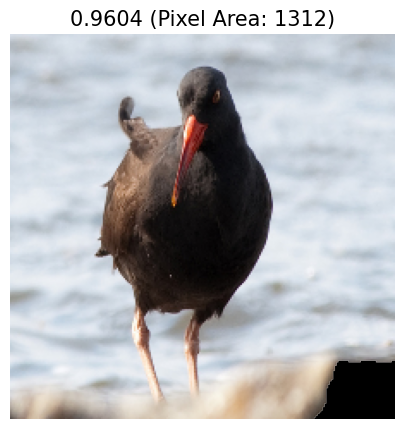

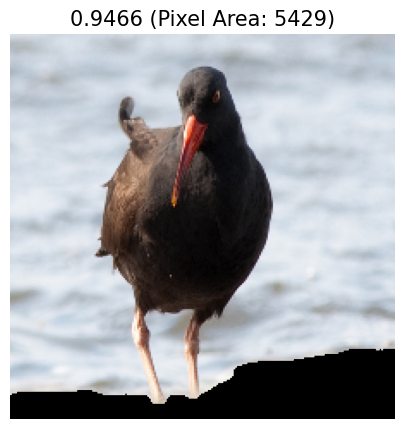

In [128]:
cur_img, cur_img_cls = imgNet100.__getitem__(400)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

Time to automask: 131.18

Number of masks detected: 2
Basic overlay of all masks:


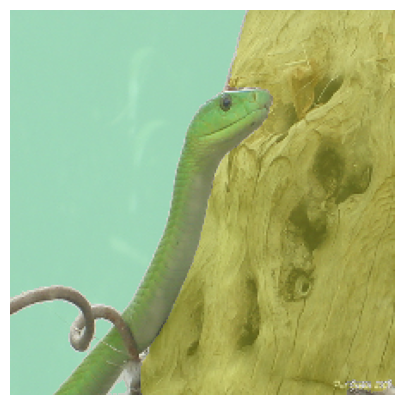


Now displaying the five largest masks, sorted by SAM score:


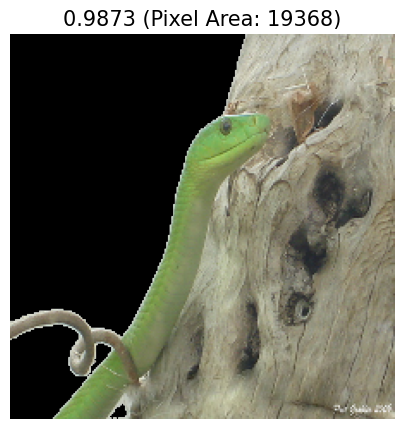

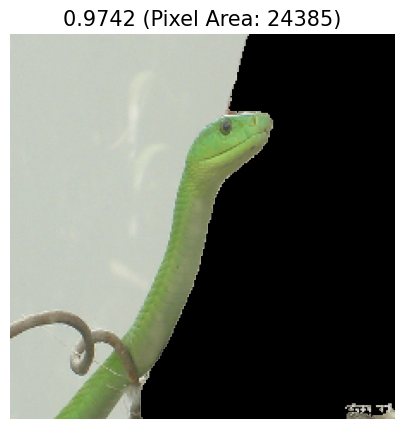

In [129]:
cur_img, cur_img_cls = imgNet100.__getitem__(7827)
stage_by_stage_eval(mask_l_generator,cur_img, cur_img_cls)

In [22]:
img, img_cls = imgNet100.__getitem__(0)

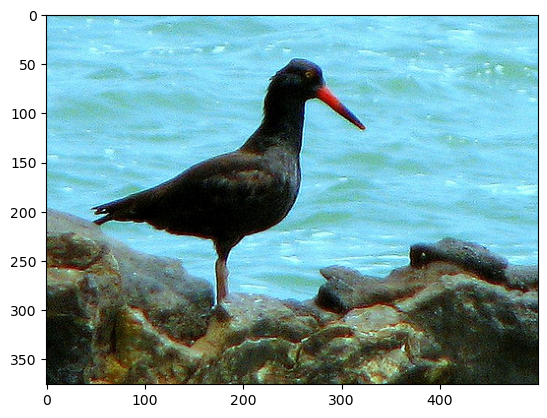

In [23]:
plt.imshow(img.permute(1, 2, 0))
plt.show()

In [66]:
img = img.numpy()
img = img.transpose((1,2,0))

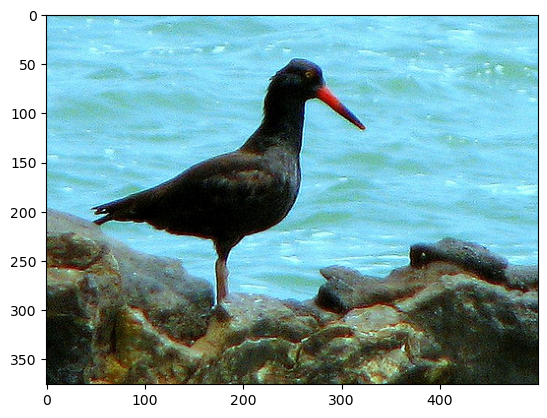

In [67]:
plt.imshow(img)
plt.show()

In [68]:
start_time = time.time()
l_masks = mask_l_generator.generate(img)
print("Time: " + str(round(time.time() - start_time,2)))

Time: 104.19


In [69]:
len(l_masks)

28

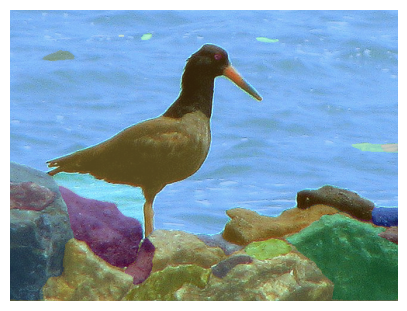

In [72]:
plt.figure(figsize=(5,5))
plt.imshow(img)
show_anns(l_masks)
plt.axis('off')
plt.show() 

In [73]:
l_masks_by_area = sorted(l_masks, key=(lambda x: x['area']), reverse=True)
l_masks_by_area = l_masks_by_area[0:5]
len(l_masks_by_area)

5

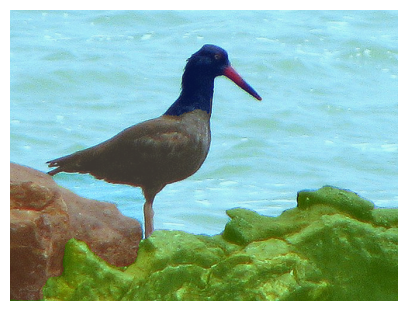

In [74]:
plt.figure(figsize=(5,5))
plt.imshow(img)
show_anns(l_masks_by_area)
plt.axis('off')
plt.show() 

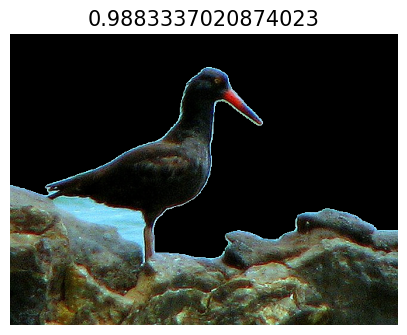

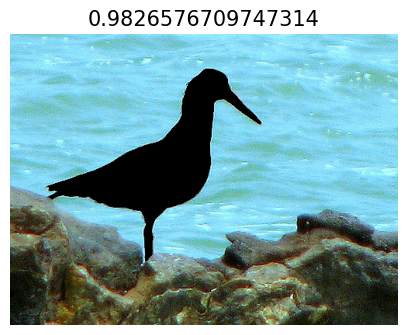

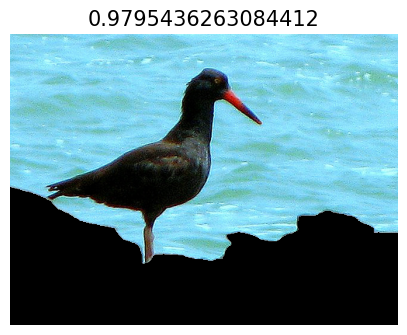

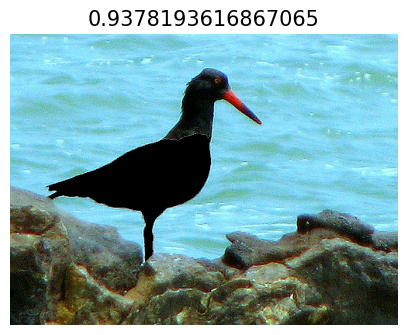

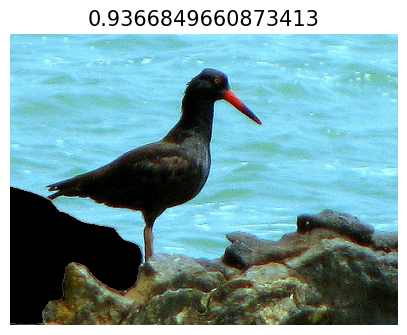

In [76]:
for i in range(len(l_masks_by_area)):
    #disp_helper(t1_img,l_t1_masks,i)
    disp_helper(img,l_masks_by_area,i,blackout=True,sort_col="stability_score")

In [ ]:
img_resize = cv2.resize(img,(224,224))

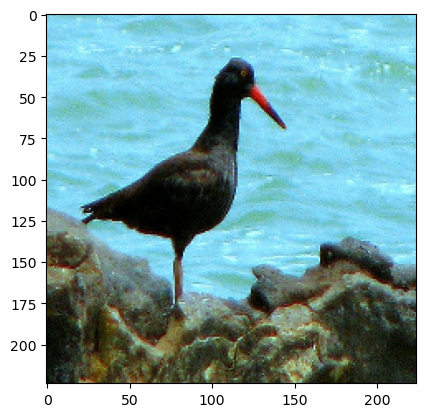

In [80]:
#img_resize.shape
plt.imshow(img_resize)
plt.show()

In [81]:
start_time = time.time()
l_masks_resize = mask_l_generator.generate(img_resize)
print("Time: " + str(round(time.time() - start_time,2)))

Time: 134.78


In [82]:
len(l_masks_resize)

33

In [83]:
l_masks_rsz_by_area = sorted(l_masks_resize, key=(lambda x: x['area']), reverse=True)
l_masks_rsz_by_area = l_masks_rsz_by_area[0:5]
len(l_masks_rsz_by_area)

5

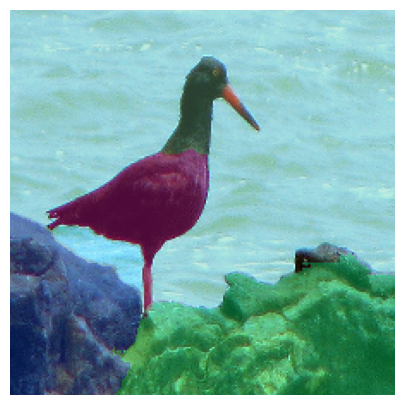

In [84]:
plt.figure(figsize=(5,5))
plt.imshow(img_resize)
show_anns(l_masks_rsz_by_area)
plt.axis('off')
plt.show() 

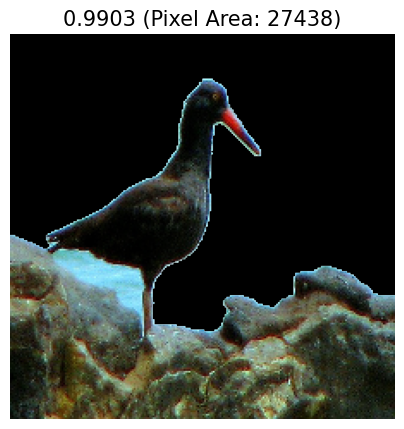

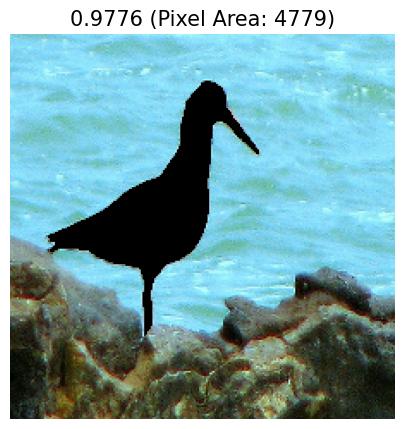

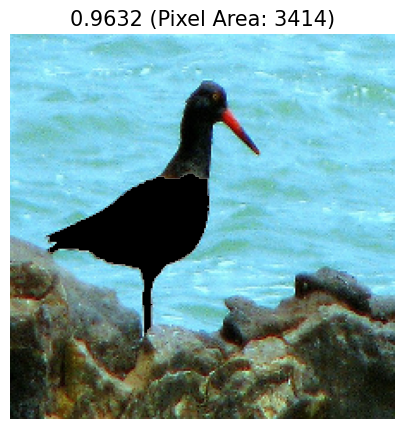

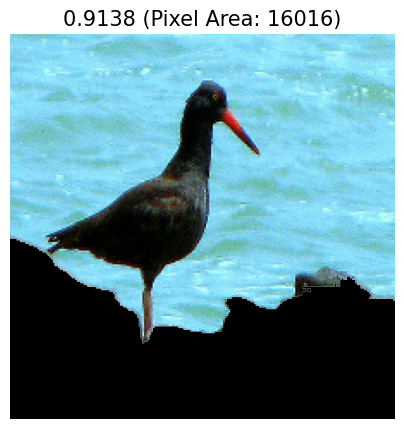

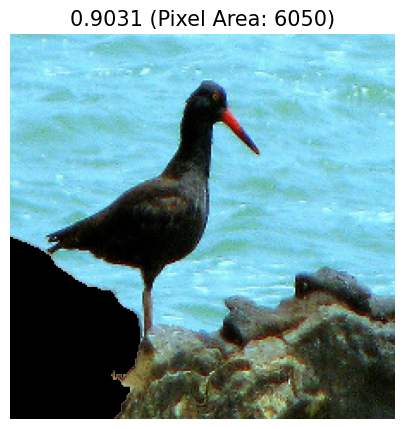

In [91]:
for i in range(len(l_masks_rsz_by_area)):
    #disp_helper(t1_img,l_t1_masks,i)
    disp_helper(img_resize,l_masks_rsz_by_area,i,blackout=True,sort_col="stability_score")

In [89]:
def show_anns_black(anns,display="all",mask_num=0,sort_col="area"):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x[sort_col]), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    if display == "all":
        for ann in sorted_anns:
            m = ann['segmentation']
            color_mask = np.concatenate([[0,0,0], [1]])
            img[m] = color_mask
    elif display == "single_mask":
        ann = sorted_anns[mask_num]
        m = ann['segmentation']
        color_mask = np.concatenate([[0,0,0], [1]])
        img[m] = color_mask
        ax.set_title(str(round(ann[sort_col],4)) + " (Pixel Area: " + str(ann["area"]) + ")",fontdict={"fontsize":15})
    ax.imshow(img)

In [90]:
def disp_helper(img,masks,i,blackout=False,sort_col="area"):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    if blackout:
        show_anns_black(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    else:
        show_anns(masks,display="single_mask",mask_num=i,sort_col=sort_col)
    plt.axis('off')
    plt.show() 

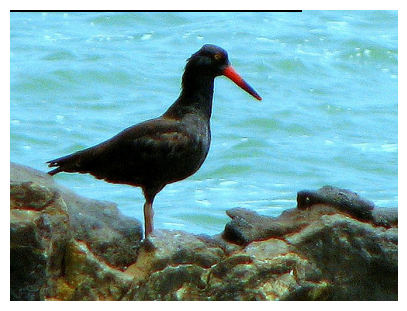

In [39]:
for i in range(len(l_masks)):
    #disp_helper(t1_img,l_t1_masks,i)
    disp_helper(img,l_masks,i,blackout=True)

In [ ]:
img.shape

torch.Size([3, 376, 500])

In [43]:
image = cv2.imread('dog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image.shape

(534, 800, 3)

In [44]:
start_time = time.time()
dog_masks = mask_l_generator.generate(image)
print("Time: " + str(round(time.time() - start_time,2)))

Time: 151.3


In [46]:
len(dog_masks)

52

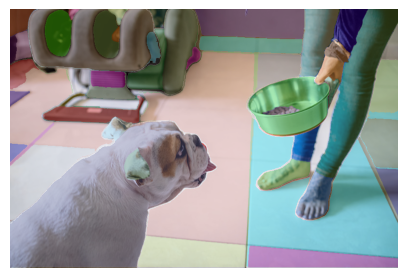

In [45]:
plt.figure(figsize=(5,5))
plt.imshow(image)
show_anns(dog_masks)
plt.axis('off')
plt.show() 

In [53]:
# for i in range(len(dog_masks)):
#     #disp_helper(t1_img,l_t1_masks,i)
#     disp_helper(image,dog_masks,i,blackout=True)

In [56]:
dog_masks_by_area = sorted(dog_masks, key=(lambda x: x['area']), reverse=True)
dog_masks_by_area = dog_masks_by_area[0:5]
len(dog_masks_by_area)

5

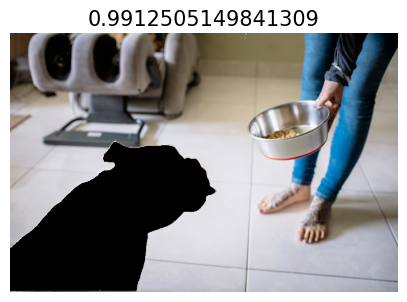

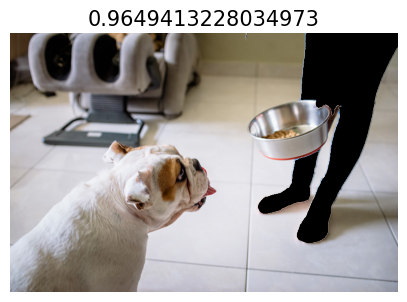

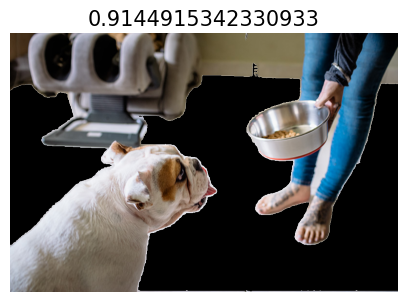

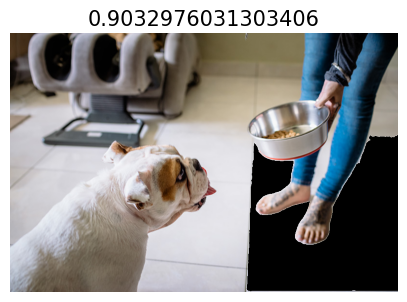

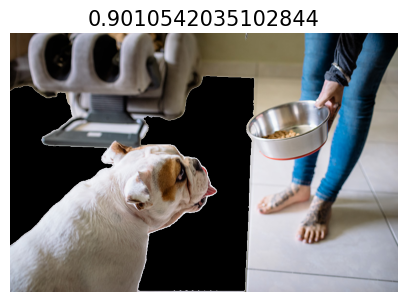

In [64]:
for i in range(len(dog_masks_by_area)):
    #disp_helper(t1_img,l_t1_masks,i)
    disp_helper(image,dog_masks_by_area,i,blackout=True,sort_col="stability_score")